# Notebook for comparing JSBACH CO2 fluxes to SIB4


In [29]:
import numpy as np
import pandas as pd
import xarray as xr
import os 
import matplotlib.pyplot as plt
import matplotlib as mpl
import cartopy.crs as ccrs

from truncate_colormap import truncate_colormap
from areagrid import areagrid

# Helper functions

In [31]:
def select_area(aoi, ds):
    # Determine the dimension names for latitude and longitude
    lat_name = 'lat' if 'lat' in ds.dims else 'latitude'
    lon_name = 'lon' if 'lon' in ds.dims else 'longitude'
    
    # Select the area based on the area of interest
    area_subset = ds.sel({lon_name: slice(aoi[0], aoi[1]),
                          lat_name: slice(aoi[2], aoi[3])})
    return area_subset


def get_fin_mask_highres(data_to_be_masked):

    """Helper function to get Finland mask with the same dimensionality
    as the data to be masked (when the data has the aoi used in this function."""

    MASK_PATH = "/home/pietaril/Documents/data/masks/country_masks/eez_01x01.nc4"
    ds_mask = xr.open_dataset(MASK_PATH)
    msk = ds_mask.Band1
    ds_mask.close()

    #limit the mask first to the same domain where the saved g/m2/yr values are
    latmin = data_to_be_masked["latitude"].values.min()-0.05
    latmax = data_to_be_masked["latitude"].values.max()+0.05
    lonmin = data_to_be_masked["longitude"].values.min()-0.05
    lonmax = data_to_be_masked["longitude"].values.max()+0.05
    aoi = [lonmin, lonmax, latmin, latmax]
    msk = select_area(aoi,msk)

    #Finland = 83
    msk_fin = msk==83

    #rename dimensions to match the ones in the data
    rename_map = {
        "lat": "latitude",
        "lon": "longitude",
        }
    msk_fin = msk_fin.rename(rename_map)

    #expand time dimension to match the data
    msk_fin_expanded = msk_fin.expand_dims(time=data_to_be_masked.time)

    return msk_fin_expanded

def sib_to_nee_g_m2_yr(ds):
    nee = ds.resp_tot - ds.gpp
    #convert fluxes to float
    #nee = nee.astype("float64")


    # unit conversion from mol m-2 s-1 to g m-2 s-1
    co2molmass = 44.009
    nee = nee*co2molmass

    # per second to per hr
    nee = nee*60*60

    #per hr to per yr
    nee = nee.sum(dim="time")
    new_ds = xr.Dataset({"nee":nee})
    
    return new_ds

def g_per_m2_per_yr_to_Mt_per_yr(ds, var):
    
    lat = ds["latitude"].values
    lon = ds["longitude"].values


    # compute the areas of the gridcells in the data
    grid_of_areas = areagrid(lat, lon)

    # pointwise multiplication by area
    totals = ds[var] * grid_of_areas


    domain_tot = totals.sum(dim=("latitude", "longitude"))

    #g to Mt
    domain_tot = domain_tot*1e-12

    return domain_tot

def sib_is_summer(fname):
    month = int(fname[-8:-6])
    return month > 5 and month < 9

def regional_totals(ds):
    """Helper function to turn (mass/mol)/m2/(unit of time) fluxes
    to those of the whole region of the dataset"""
    lat = ds["latitude"].values
    lon = ds["longitude"].values

    # compute the areas of the gridcells in the data
    grid_of_areas = areagrid(lat, lon)

    # pointwise multiplication by area to get mol/gridcell/s
    out = ds * grid_of_areas

    #get regional totals 
    out = out.sum(dim=("latitude", "longitude"))

    return out

def mean_per_hour_of_day(ds):
    out = ds.groupby("time.hour").mean(skipna=True)
    return out




def daily_mean(ds):
    
    out = ds.groupby("time.dayofyear").mean("time")

    return out

def regularize_timestamps(ds):
    """A helper to adjust hourly JSBACH data timestamps so that they are evenly distributed on the day
    (right now there's variance of a couple of minutes between consecutive timestamps likely due to some rounding errors)"""
    # Extract time values as a pandas DatetimeIndex
    time_index = ds["time"].to_pandas()

    # Convert to DataFrame to manipulate hours/minutes
    time_df = pd.DataFrame({"time": time_index})

    # Generate corrected hour values (0-23 repeated for each unique day)
    unique_days = time_df["time"].dt.date.unique()  # Get unique dates
    new_times = []

    for day in unique_days:
        new_hours = np.arange(24)  # Ensuring hours 0-23
        new_dates = [pd.Timestamp(f"{day} {h}:30:00") for h in new_hours]
        new_times.extend(new_dates)

    # Convert back to xarray format
    new_time_index = pd.DatetimeIndex(new_times)
    newds = ds.assign_coords(time=new_time_index)
    return newds

In [7]:
dstest = xr.open_dataset("/home/pietaril/Documents/data/SiB4/sib4-hourly-2018/sib4-hourly-2018-08-05.nc")
dstest

<xarray.Dataset>
Dimensions:    (time: 24, latitude: 360, longitude: 720)
Coordinates:
  * longitude  (longitude) float32 -179.8 -179.2 -178.8 ... 178.8 179.2 179.8
  * latitude   (latitude) float32 -89.75 -89.25 -88.75 ... 88.75 89.25 89.75
  * time       (time) datetime64[ns] 2018-08-05T00:29:59.999999872 ... 2018-0...
Data variables:
    gpp        (time, latitude, longitude) float32 ...
    resp_tot   (time, latitude, longitude) float32 ...
    emis_fire  (time, latitude, longitude) float32 ...
    resp_auto  (time, latitude, longitude) float32 ...
    resp_het   (time, latitude, longitude) float32 ...
Attributes:
    email:        aleya.kaushik@noaa.gov
    url:          https://www.gml.noaa.gov/aftp/user/kaushik/SiB4_priors_for_...
    institution:  CU Boulder CIRES/NOAA Global Monitoring Lab

In [ ]:
MASK_PATH = "/home/pietaril/Documents/data/masks/country_masks/combined_mask_0.5deg_updated.nc"
ds_mask = xr.open_dataset(MASK_PATH)
ds_mask.eez_mask[:,:, "FIN"]

# Regional hourly averages for summer months

## SIB

In [36]:

PATHTOSIB = "/home/pietaril/Documents/data/SiB4/"
aoi = [-12, 35, 35, 72]

hourly_means_sib = []
years_sib = []
subdirs = os.listdir(PATHTOSIB)
subdirs.sort()
wholeur = True

for subdir in subdirs:
    year = subdir[-4:]
    years_sib.append(year)
    PATH = os.path.join(PATHTOSIB, subdir)
    #only take summer months
    fnames = [os.path.join(PATH, f) for f in os.listdir(PATH) if sib_is_summer(f)]
    fnames.sort()
    ds = xr.open_mfdataset(fnames, engine="h5netcdf")

    if wholeur:
        subset = select_area(aoi, ds)
    #else:
        #msk_fin = get_fin_mask_
    nee = subset.resp_tot - subset.gpp

    #mean per hour of day
    hourly_mean_nee = mean_per_hour_of_day(nee)

    #regional
    hourly_mean_nee = regional_totals(hourly_mean_nee)

    # unit conversion from mol/s to g/s
    co2molmass = 44.009
    hourly_mean_nee = hourly_mean_nee*co2molmass

    hourly_mean_nee = xr.Dataset({"nee":hourly_mean_nee})
    hourly_mean_nee["year"] = year
    hourly_means_sib.append(hourly_mean_nee.compute())
    ds.close()
    



In [37]:
ds_hourly_means_sib = xr.concat(hourly_means_sib, dim="year")
sib_min = ds_hourly_means_sib.min(dim="year")
sib_max = ds_hourly_means_sib.max(dim="year")
sib_mean = ds_hourly_means_sib.mean(dim="year")

## JSBACH
* Since JSBACH data has some rounding problem with the daily timestamps (i.e. something happened when 1 day divided into 24 hours so that the time between consecutive timestamps isn't constant), I needed to adjust them by ~30 minutes

In [ ]:
PATHTORAWDATA = "/home/pietaril/Documents/data/JSBACH_CO2/raw_data_example/hourly_NEE_201608.nc"
ds = xr.open_dataset(PATHTORAWDATA)


<xarray.DataArray 'hour' (time: 24)>
array([ 0,  1,  1,  3,  4,  4,  6,  7,  7,  9, 10, 10, 12, 13, 13, 15, 16,
       16, 18, 19, 19, 21, 22, 22])
Coordinates:
  * time     (time) datetime64[ns] 2016-08-01 ... 2016-08-01T22:58:07.500000256

In [39]:

aoi = [-12, 35, 35, 72]
wholeur = False


hourly_means_jsbach = []
years_jsbach = []
PATHTOJSBACH = "/home/pietaril/Documents/data/JSBACH_CO2/bio_prior_domain_-12_35_35_72/"
fnames = [os.path.join(PATHTOJSBACH, f) for f in os.listdir(PATHTOJSBACH)]
fnames.sort()
for k in range(len(fnames)):
    f = fnames[k]
    yearjsbach = f[-7:-3]
    years_jsbach.append(yearjsbach)
    #the dataset has unit kg/m2/hr
    ds = xr.open_dataset(f)
    ds_summer = ds.isel(time=ds.time.dt.month.isin([5, 6, 7]))

    #unit conversion to g/m2/s 
    nee = ds_summer["emi_bio"]*10/36
    
    #adjust the time axis to have regular intervals between hours
    nee = regularize_timestamps(nee)
    if not wholeur:
        fin_msk = get_fin_mask_highres(nee)
        nee = nee.where(fin_msk.values, drop=False)

    nee = regional_totals(nee)
    nee = mean_per_hour_of_day(nee)
  
    hourly_mean_nee = xr.Dataset({"nee":nee})
    hourly_mean_nee["year"] = yearjsbach
    hourly_means_jsbach.append(hourly_mean_nee)
    ds.close()
    
    

In [34]:
ds_hourly_means_jsbach = xr.concat(hourly_means_jsbach, dim="year")
jsbach_min = ds_hourly_means_jsbach.min(dim="year")
jsbach_min = jsbach_min.sortby("hour")
jsbach_max = ds_hourly_means_jsbach.max(dim="year")
jsbach_max = jsbach_max.sortby("hour")
jsbach_mean = ds_hourly_means_jsbach.mean(dim="year")
jsbach_mean = jsbach_mean.sortby("hour")

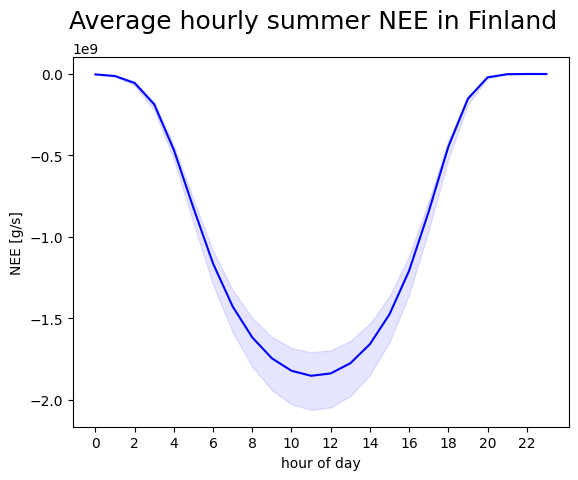

In [40]:
fig, ax = plt.subplots()
line1, = ax.plot(jsbach_mean["nee"], color="blue", label= "JSBACH")
ax.fill_between(jsbach_min["hour"].values, jsbach_min["nee"].values, jsbach_max["nee"].values, color="blue", alpha = 0.1)
#line2, = ax.plot(sib_mean["nee"], color = "orange", label = "SiB4")
#ax.fill_between(sib_min["hour"].values, sib_min["nee"].values, sib_max["nee"].values, color="orange", alpha=0.1)
#ax.legend(handles=[line1, line2])
ax.set_xlabel("hour of day")
ax.set_xticks(range(0,24,2))
ax.set_ylabel("NEE [g/s]")
if wholeur:
    domain = "Europe"
else:
    domain = "Finland"
fig.suptitle(f"Average hourly summer NEE in {domain}", fontsize=18)
FIGPATH = "/home/pietaril/Documents/plots/JSBACH/"
#figname = f"NEE_diurnal_{domain}_vs_Sib.png"
#plt.savefig(FIGPATH+figname)

# Daily timeseries comparison

## SIB

In [7]:

PATHTOSIB = "/home/pietaril/Documents/data/SiB4/"
aoi = [-12, 35, 35, 72]

daily_fluxes_sib = []
years_sib = []
subdirs = os.listdir(PATHTOSIB)
subdirs.sort()
wholeur = True

for subdir in subdirs:
    year = subdir[-4:]
    years_sib.append(year)
    PATH = os.path.join(PATHTOSIB, subdir)
    
    fnames = [os.path.join(PATH, f) for f in os.listdir(PATH)]
    fnames.sort()
    ds = xr.open_mfdataset(fnames, engine="h5netcdf")

    if wholeur:
        subset = select_area(aoi, ds)
    #else:
        #msk_fin = get_fin_mask_
    nee = subset.resp_tot - subset.gpp
    
    # unit conversion from mol/m2/s to g/m2/s
    co2molmass = 44.009
    nee = nee*co2molmass
    
    #to g/m2/hr
    nee = nee*3600

    # daily totals
    nee_daily = nee.groupby("time.dayofyear").sum()


    #whole region
    nee_daily = regional_totals(nee_daily)

    nee_daily = xr.Dataset({"nee":nee_daily})
    nee_daily["year"] = year
    daily_fluxes_sib.append(nee_daily.compute())
    ds.close()

In [19]:
daily_sib = xr.concat(daily_fluxes_sib, dim="time")
#in teragrams
daily_sib["nee"] = daily_sib["nee"]*1e-12
daily_sib_mean = daily_sib.mean("time")
daily_sib_min = daily_sib.min("time")
daily_sib_max = daily_sib.max("time")

In [10]:
daily_sib

<xarray.Dataset>
Dimensions:    (dayofyear: 366, time: 7)
Coordinates:
  * dayofyear  (dayofyear) int64 1 2 3 4 5 6 7 8 ... 360 361 362 363 364 365 366
Dimensions without coordinates: time
Data variables:
    nee        (time, dayofyear) float64 2.353e+13 2.352e+13 ... 2.575e+13 nan
    year       (time) <U4 '2015' '2016' '2017' '2018' '2019' '2020' '2021'

## JSBACH computed in a separate script due to kernel crashes

In [21]:
PATHTODAILY = "/home/pietaril/Documents/data/JSBACH_CO2/daily_totals/jsbach_daily.nc"
daily_jsbach = xr.open_dataset(PATHTODAILY)
#in teragrams
daily_jsbach["nee"] = daily_jsbach["nee"]*1e-12
daily_jsbach_mean = daily_jsbach.mean("time")
daily_jsbach_min = daily_jsbach.min("time")
daily_jsbach_max = daily_jsbach.max("time")

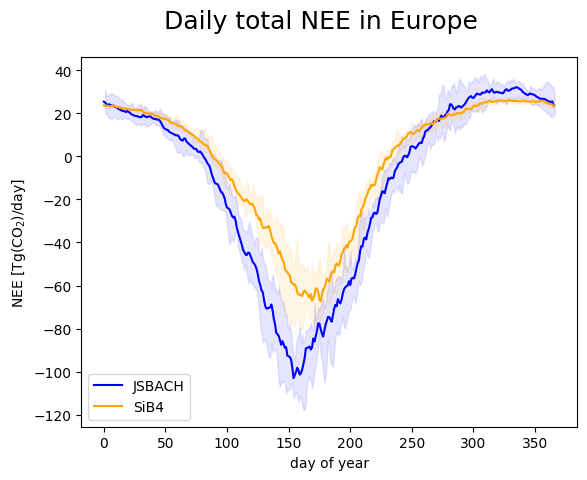

In [24]:
fig, ax = plt.subplots()
line1, = ax.plot(daily_jsbach_mean["nee"], color="blue", label= "JSBACH")
ax.fill_between(daily_jsbach_min["dayofyear"].values, daily_jsbach_min["nee"].values, daily_jsbach_max["nee"].values, color="blue", alpha = 0.1)
line2, = ax.plot(daily_sib_mean["nee"], color = "orange", label = "SiB4")
ax.fill_between(daily_sib_min["dayofyear"].values, daily_sib_min["nee"].values, daily_sib_max["nee"].values, color="orange", alpha=0.1)
ax.legend(handles=[line1, line2])
ax.set_xlabel("day of year")
#ax.set_xticks(range(0,24,2))
ax.set_ylabel("NEE [Tg(CO$_2$)/day]")
fig.suptitle("Daily total NEE in Europe", fontsize=18)
FIGPATH = "/home/pietaril/Documents/plots/JSBACH/"
figname = "NEE_daily_Fin_vs_Sib.png"
plt.savefig(FIGPATH+figname)

# Some old unfinished code

In [3]:
#convert to g/m2/yr and collect the converted datasets in a list

PATHTOSIB = "/home/pietaril/Documents/data/SiB4/"
aoi = [-12, 35, 35, 72]

ls_yearly_sib = []
ls_tot_sib = []
years_sib = []
subdirs = os.listdir(PATHTOSIB)
subdirs.sort()

for subdir in subdirs[:2]:
    year = subdir[-4:]
    PATH = os.path.join(PATHTOSIB, subdir)
    fnames = [os.path.join(PATH, f) for f in os.listdir(PATH)]
    fnames.sort()
    ds = xr.open_mfdataset(fnames, engine="h5netcdf")
    ds = select_area(aoi, ds)
    nee_g_m2_yr = sib_to_nee_g_m2_yr(ds)
    nee_g_m2_yr["time"] = year
    sib_tot = g_per_m2_per_yr_to_Mt_per_yr(nee_g_m2_yr, "nee")
    ls_yearly_sib.append(nee_g_m2_yr)
    ls_tot_sib.append(sib_tot)
    years_sib.append(year)

    

In [4]:
ds

<xarray.Dataset>
Dimensions:    (time: 8784, latitude: 74, longitude: 94)
Coordinates:
  * longitude  (longitude) float32 -11.75 -11.25 -10.75 ... 33.75 34.25 34.75
  * latitude   (latitude) float32 35.25 35.75 36.25 36.75 ... 70.75 71.25 71.75
  * time       (time) datetime64[ns] 2016-01-01T00:30:00 ... 2016-12-31T23:30...
Data variables:
    gpp        (time, latitude, longitude) float32 dask.array<chunksize=(24, 74, 94), meta=np.ndarray>
    resp_tot   (time, latitude, longitude) float32 dask.array<chunksize=(24, 74, 94), meta=np.ndarray>
    emis_fire  (time, latitude, longitude) float32 dask.array<chunksize=(24, 74, 94), meta=np.ndarray>
    resp_auto  (time, latitude, longitude) float32 dask.array<chunksize=(24, 74, 94), meta=np.ndarray>
    resp_het   (time, latitude, longitude) float32 dask.array<chunksize=(24, 74, 94), meta=np.ndarray>
Attributes:
    email:        aleya.kaushik@noaa.gov
    url:          https://www.gml.noaa.gov/aftp/user/kaushik/SiB4_priors_for_...
    institution:  CU Boulder CIRES/NOAA Global Monitoring Lab

In [5]:
sib_tot.values

array(920.1930793)

In [14]:
nee_g_m2_yr

<xarray.Dataset>
Dimensions:    (longitude: 94, latitude: 74)
Coordinates:
  * longitude  (longitude) float32 -11.75 -11.25 -10.75 ... 33.75 34.25 34.75
  * latitude   (latitude) float32 35.25 35.75 36.25 36.75 ... 70.75 71.25 71.75
Data variables:
    nee        (latitude, longitude) float64 dask.array<chunksize=(74, 94), meta=np.ndarray>
    time       <U4 '2021'

In [16]:
#open the corresponding JSBACH files

ls_yearly_jsbach = []
ls_tot_jsbach = []
years_jsbach = []
PATHTOJSBACH = "/home/pietaril/Documents/data/JSBACH_CO2/g_m2_yr_grids/"
fnames = [os.path.join(PATHTOJSBACH, f) for f in os.listdir(PATHTOJSBACH)]
fnames.sort()
for f in fnames:
    year = f[-7:-3]
    ds_jsbach = xr.open_dataset(f)
    ds_jsbach = select_area(aoi, ds_jsbach)
    #ds_jsbach = ds_jsbach["emi_bio"]
    jsbach_tot = g_per_m2_per_yr_to_Mt_per_yr(ds_jsbach, "emi_bio")
    ls_yearly_jsbach.append(ds_jsbach)
    ls_tot_jsbach.append(jsbach_tot)
    years_jsbach.append(year)
    

In [20]:
sib_tot[:]

IndexError: too many indices

In [18]:
jsbach_tot

<xarray.DataArray 'emi_bio' (time: 1)>
array([-4238.43481927])
Coordinates:
  * time     (time) datetime64[ns] 2021-07-01

In [17]:
print(years_jsbach)
print(years_sib)

['2015', '2016', '2017', '2018', '2019', '2020', '2021']
['2015', '2016', '2017', '2018', '2019', '2020', '2021']


In [ ]:
fig, ax = plt.subplots(layout="constrained")#, figsize=(9,6))
labels = ["SiB4", "JSBACH"]

for (ind,tot) in enumerate(totals):
    data = tot
    data.plot(x="time", ax=ax, marker='.', markersize=12, markerfacecolor='white', label=labels[ind])


#Shrink current axis by 20%
#box = ax.get_position()
#ax.set_position([box.x0, box.y0, box.width, box.height])

# Put a legend to the right of the current axis
ax.legend()#loc='center left')#, bbox_to_anchor=(0.5, 0.8))
ax.set_ylabel("total CO$_2$ emission [Mt/year]")
ax.set_xlabel("")
fig.suptitle("Europe's total ocean emission (CTE-HR)", fontsize = 18 )
#plt.legend()
plt.draw()
figpath = "/home/pietaril/Documents/plots/CTE/total_emis/"
figname = f"CTE_ocean_yearly_totals_CO2.png"
#plt.savefig(figpath+figname)

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 1:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 1:
  #000: H5A.c line 528 in H5Ao

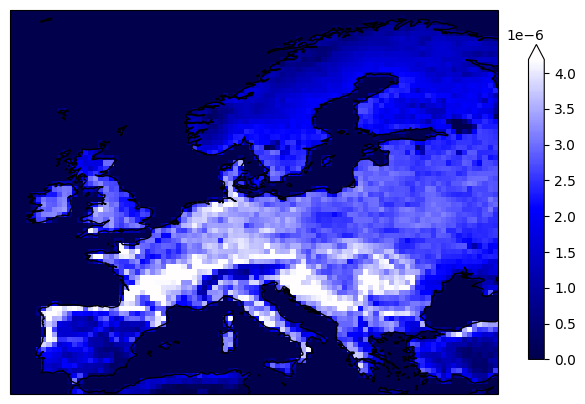

In [17]:


cbar_label = ""#"$g(CO_2)$ $m^{-2}$ $yr^{-1}$"
#variable = "emi_bio"
cbar_shrink = 0.7
cmap = truncate_colormap(mpl.colormaps["seismic"], maxval=0.5)
suptitle=""#"Average biospheric CO$_2$ fluxes $2017-2021$"




fig, ax = plt.subplots(subplot_kw=dict(projection=ccrs.PlateCarree()))

mean_resp.plot.pcolormesh(ax=ax, 
                                      robust=True, cmap=cmap,
                                       cbar_kwargs=dict(label=cbar_label, shrink=cbar_shrink))
ax.coastlines()
ax.set_title(suptitle)
plt.tight_layout()
plt.draw()
figpath = "/home/pietaril/Documents/plots/JSBACH/"
figname = f"JSBACH_scandinavia_mean_CO2_flux_2017_2021.png"
#plt.savefig(figpath+figname)
plt.draw()